[![Github](https://raw.githubusercontent.com/youssefboutaleb/sihechem/main/github-mark.svg)](https://github.com/youssefboutaleb/colorizeblack-whitephotos)
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1d7gkoocjpD1QvpGxK9Vm7seTZDSqB0Wj?usp=sharing)                    

## colorize black-white photos
  
This is an  academic project titled "Colorize Black-White Photos" aims to develop a deep learning model that can colorize grayscale images automatically. The project will focus on using neural networks to train a model that can understand the features and patterns present in black-and-white images and generate plausible colorized versions of the same .

for more [details](https://emilwallner.medium.com/colorize-b-w-photos-with-a-100-line-neural-network-53d9b4449f8d)


# Using GPU

In [33]:
#To make sure Colab uses GPU you can run:
#' ' means CPU whereas '/device:G:0' means GPU
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

the GPU provided has 12GB of memory. However, sometimes the memory of your GPU is shared with other users. At that situation you won’t be able to train your model properly. To make sure that the current GPU memory utilization is 0, run the code below:



In [34]:
# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm() 


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7393 sha256=61a35f79f6dad31871318f88b7e982c4d3fe39f29539c3ed3ad20c88313fd937
  Stored in directory: /root/.cache/pip/wheels/a9/8a/bd/81082387151853ab8b6b3ef33426e98f5cbfebc3c397a9d4d0
Successfully built gputil
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Gen RAM Free: 3.8 GB  | Proc size: 9.3 GB
GPU RAM Free: 560MB | Used: 14541MB | Util  95% | Total 15360MB


In [ ]:
#if you don't see     Used: 0MB | Util   0%
#try to kill your machine, using the code below(!kill -9 -1). This might not work on your first attempt and you can try this multiple times.
#!kill -9 -1
#after that you can check again the current GPU memory utilization( just rerun the previous cell )

# **Mounting the data**

In [1]:
!git clone https://github.com/youssefboutaleb/colorizeblack-whitephotos
import os
os.listdir("/content/colorizeblack-whitephotos")


fatal: destination path 'colorizeblack-whitephotos' already exists and is not an empty directory.


['Alpha-version',
 'Full-version',
 '.git',
 'README.md',
 'GAN-version',
 'Beta-version']

# Description:

The network is built in four parts and gradually becomes more complex. The first part is the bare minimum to understand the core parts of the network. It's built to color one image. Once I have something to experiment with, I find it easier to add the remaining 80% of the network.

For the second stage, the Beta version, I start automating the training flow. In the full version, I add features from a pre-trained classifier. The GAN version is not covered in the tutorial. It's an experimental version using some of the emerging best practices in image colorization.




# **Alpha Version** 

In [15]:
#install libs
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [16]:
#import libs
from tensorflow.keras.utils import img_to_array,array_to_img,load_img
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from tensorflow.keras.layers import BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator 
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
import numpy as np
import os
import random
import tensorflow as tf
import matplotlib.pyplot as plt



In [17]:
# Get images
#you can choose  any image from the dataset :colorizeblack-whitephotos/Alpha-version/ALPHA_DATASET
image_name="man.jpg"
image = img_to_array(load_img('/content/colorizeblack-whitephotos/Alpha-version/ALPHA_DATASET/'+image_name))
image = np.array(image, dtype=float)

In [18]:
# Extract  X and Y from the image 
X = rgb2lab(1.0/255*image)[:,:,0]
Y = rgb2lab(1.0/255*image)[:,:,1:]
Y /= 128
X = X.reshape(1, 400, 400, 1)
Y = Y.reshape(1, 400, 400, 2)


In [19]:
# Building the neural network
model = Sequential()
model.add(InputLayer(input_shape=(None, None, 1)))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(8, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', strides=2))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))

In [20]:
# Finish model
model.compile(optimizer='rmsprop',loss='mse')


In [21]:
# The alpha version is an introductory or testing version, where the parameters are usually set by default and not fully optimized
model.fit(x=X, 
    y=Y,
    batch_size=1,
    epochs=1000)


Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 0.6570
Epoch 2/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.7920
Epoch 3/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.0204
Epoch 4/1000
1/1 [==============================] - 0s 15ms/step - loss: 0.0165
Epoch 5/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.0141
Epoch 6/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.0160
Epoch 7/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.0147
Epoch 8/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.0138
Epoch 9/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.0121
Epoch 10/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.0119
Epoch 11/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.0118
Epoch 12/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.0116
Epoch 13/1000
1/1 [====================

In [22]:
print(model.evaluate(X, Y, batch_size=1))
output = model.predict(X)
output *= 128
# Output colorizations
cur = np.zeros((400, 400, 3))
cur[:,:,0] = X[0][:,:,0]
cur[:,:,1:] = output[0]
# Convert the data type to uint8
img_uint8 = (lab2rgb(cur) * 255).astype(np.uint8)
img_uint8_gay = (rgb2gray(lab2rgb(cur)) * 255).astype(np.uint8)

imsave("/content/colorizeblack-whitephotos/Alpha-version/result/img_result.png", img_uint8)
imsave("/content/colorizeblack-whitephotos/Alpha-version/result/img_gray_version.png",img_uint8_gay )


1/1 [==============================] - 1s 600ms/step - loss: 0.0018
0.0017751792911440134
1/1 [==============================] - 1s 507ms/step


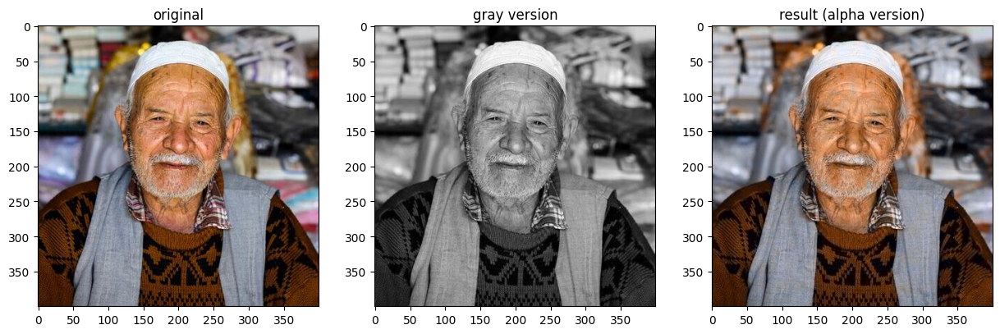

In [23]:
#display result
import matplotlib.pyplot as plt
import numpy as np

# Load three example images
image1 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/ALPHA_DATASET/"+image_name)
image2 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/result/img_gray_version.png")
image3 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/result/img_result.png")

# Create a 2x2 grid of subplots
fig, ax = plt.subplots(1, 3,figsize=(15, 5))



# Display the first image in the first subplot
ax[0].imshow(image1)
ax[0].set_title("original")

# Display the second image in the second subplot
ax[1].imshow(image2,cmap="gray")
ax[1].set_title("gray version")

# Display the third image in the third subplot
ax[2].imshow(image3)
ax[2].set_title("result (alpha version)")

# Show the plot
plt.show()



**Note:** To understand the weakness of the alpha version, try coloring an image it has not been trained on. If you try it, you’ll see that it makes a poor attempt. It’s because the network has memorized the information. It has not learned how to color an image it hasn’t seen before. But this is what we’ll do in the beta version. We’ll teach our network to generalize.



1/1 [==============================] - 0s 107ms/step


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 154 pixels
  return func(*args, **kwargs)


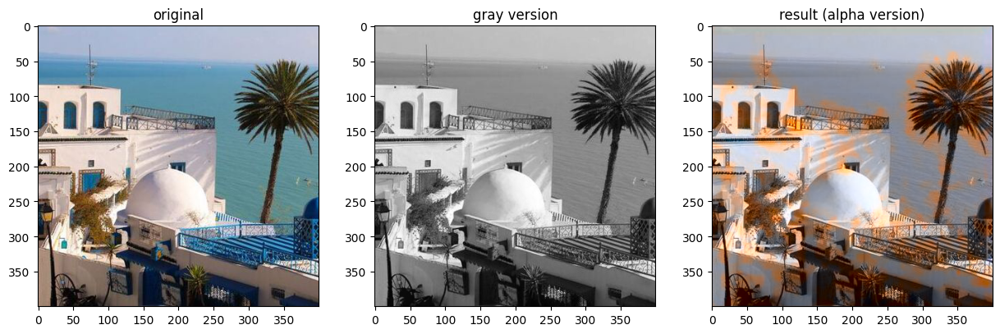

In [24]:
#testing the model in another picture 
#chose another image from the dataset
test_image_name="SidiBouSaid.jpg"
image = img_to_array(load_img('/content/colorizeblack-whitephotos/Alpha-version/ALPHA_DATASET/'+test_image_name))
image = np.array(image, dtype=float)
X = rgb2lab(1.0/255*image)[:,:,0]
X = X.reshape(1, 400, 400, 1)
output = model.predict(X)
output *= 128
# Output colorizations
cur = np.zeros((400, 400, 3))
cur[:,:,0] = X[0][:,:,0]
cur[:,:,1:] = output[0]
img_uint8 = (lab2rgb(cur) * 255).astype(np.uint8)
img_uint8_gay = (rgb2gray(lab2rgb(cur)) * 255).astype(np.uint8)
imsave("/content/colorizeblack-whitephotos/Alpha-version/result/img_result_test.png", img_uint8)
imsave("/content/colorizeblack-whitephotos/Alpha-version/result/img_gray_version_test.png", img_uint8_gay)

#display result
# Load three example images
image1 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/ALPHA_DATASET/"+test_image_name)
image2 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/result/img_gray_version_test.png")
image3 = plt.imread("/content/colorizeblack-whitephotos/Alpha-version/result/img_result_test.png")

# Create a 2x2 grid of subplots
fig, ax = plt.subplots(1, 3,figsize=(15, 5))



# Display the first image in the first subplot
ax[0].imshow(image1)
ax[0].set_title("original")

# Display the second image in the second subplot
ax[1].imshow(image2,cmap="gray")
ax[1].set_title("gray version")

# Display the third image in the third subplot
ax[2].imshow(image3)
ax[2].set_title("result (alpha version)")

# Show the plot
plt.show()




# **Beta Version** 

**DATA SECTION :**

To customize my project, I choose to work with the huggingnft/crypto-punks [dataset](https://huggingface.co/datasets/huggingnft/cryptopunks). To import and format the images, here is the [code](https://github.com/youssefboutaleb/colorizeblack-whitephotos/blob/main/Beta-version/scripts/importing%26resizingdata.py) I used.
 After these processes (importing and resizing the images), I saved the dataset on [Github](https://github.com/youssefboutaleb/colorizeblack-whitephotos/blob/main/Beta-version/Beta_Dataset.zip) to use it in the beta version and avoid processing the data every time .
 
 partition: 80% train , 20% test


In [4]:
#import libs
from tensorflow.keras.utils import img_to_array,array_to_img,load_img
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from tensorflow.keras.layers import BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator 
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
import numpy as np
import os
import random
import tensorflow as tf
import matplotlib.pyplot as plt



**NOTE :**

I will use only one folder (1000 images) from the [Trainset](https://github.com/youssefboutaleb/colorizeblack-whitephotos/tree/main/Beta-version/Train), which contains a total of 8 folders with 1000 images in each folder. If you want to train the entire dataset, you can use this optimized [script](https://github.com/youssefboutaleb/colorizeblack-whitephotos/blob/main/Beta-version/scripts/load_all_train_data.py) to prevent Colab from crashing, but it will take more than one hour to complete.

In [5]:
# Get images
import os
import random
X = []
#choose a random folder 
data="Train"+str(random.randint(0, 7))
print(data)
for filename in os.listdir('/content/colorizeblack-whitephotos/Beta-version/Train/'+data):
    X.append(img_to_array(load_img('/content/colorizeblack-whitephotos/Beta-version/Train/'+data+"/"+filename)))
X = np.array(X, dtype=float)

Train5


In [6]:
# Set up training and test data
split = int(0.95*len(X))
Xtrain = X[:split]
Xtrain = 1.0/255*Xtrain

In [7]:
#Design the neural network
model = Sequential()
model.add(InputLayer(input_shape=(256, 256, 1)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))

In [8]:
# Finish model
model.compile(optimizer='rmsprop', loss='mse')

In [9]:
# Image transformer
datagen = ImageDataGenerator(
        shear_range=0.2,
        zoom_range=0.2,
        rotation_range=20,
        horizontal_flip=True)
# Generate training data
batch_size = 50
def image_a_b_gen(batch_size):
    for batch in datagen.flow(Xtrain, batch_size=batch_size):
        lab_batch = rgb2lab(batch)
        X_batch = lab_batch[:,:,:,0]
        Y_batch = lab_batch[:,:,:,1:] / 128
        yield (X_batch.reshape(X_batch.shape+(1,)), Y_batch)

NOTE:
To choose the best parameters (batch size, steps per epoch, epochs), you can use this [script](https://github.com/youssefboutaleb/colorizeblack-whitephotos/blob/main/Beta-version/scripts/best_parameters.ipynb). Please note that it may take a while to run - for example, the first set of parameters (32, 10, 500) could take up to an hour to complete. Nevertheless, running the script with various parameter combinations can assist you in determining the optimal values for your model.











In [10]:
# Train model
model.fit_generator(image_a_b_gen(batch_size), steps_per_epoch=200, epochs=10)


<ipython-input-10-a55d3d8f4d7a>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(image_a_b_gen(batch_size), steps_per_epoch=200, epochs=10)


Epoch 1/10
200/200 [==============================] - 295s 1s/step - loss: 0.1461
Epoch 2/10
200/200 [==============================] - 267s 1s/step - loss: 0.0159
Epoch 3/10
200/200 [==============================] - 267s 1s/step - loss: 0.0144
Epoch 4/10
200/200 [==============================] - 267s 1s/step - loss: 0.0143
Epoch 5/10
200/200 [==============================] - 265s 1s/step - loss: 0.0128
Epoch 6/10
200/200 [==============================] - 265s 1s/step - loss: 0.0119
Epoch 7/10
200/200 [==============================] - 265s 1s/step - loss: 0.0110
Epoch 8/10
200/200 [==============================] - 265s 1s/step - loss: 0.0102
Epoch 9/10
200/200 [==============================] - 266s 1s/step - loss: 0.0108
Epoch 10/10
200/200 [==============================] - 265s 1s/step - loss: 0.0095


In [11]:
# Test images
Xtest = rgb2lab(1.0/255*X[split:])[:,:,:,0]
Xtest = Xtest.reshape(Xtest.shape+(1,))
Ytest = rgb2lab(1.0/255*X[split:])[:,:,:,1:]
Ytest = Ytest / 128
print(model.evaluate(Xtest, Ytest, batch_size=batch_size))
#choose a random folder 
Test="Test"+str(random.randint(0, 9))
# Load black and white images
color_me = []
for filename in os.listdir('/content/colorizeblack-whitephotos/Beta-version/Test/'+Test):
        color_me.append(img_to_array(load_img('/content/colorizeblack-whitephotos/Beta-version/Test/'+Test+'/'+filename)))
color_me = np.array(color_me, dtype=float)
color_me = rgb2lab(1.0/255*color_me)[:,:,:,0]
color_me = color_me.reshape(color_me.shape+(1,))
# Test model
output = model.predict(color_me)
output = output * 128
# Output colorizations
for i in range(len(output)):
        cur = np.zeros((256, 256, 3))
        cur[:,:,0] = color_me[i][:,:,0]
        cur[:,:,1:] = output[i]
        # Convert the data type to uint8
        img_uint8 = (lab2rgb(cur) * 255).astype(np.uint8)
        imsave("colorizeblack-whitephotos/Beta-version/result/img_"+str(i)+".png", img_uint8)


1/1 [==============================] - 0s 464ms/step - loss: 0.0085
0.008465752936899662
7/7 [==============================] - 5s 265ms/step


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 52 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 16 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared

**the results are in the folder :**

colorizeblack-whitephotos/Beta-version/result/

# **Full-version**


In [1]:
#import libs
from tensorflow.keras.utils import img_to_array,array_to_img,load_img
from keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose
from keras.layers import Activation, Dense, Dropout, Flatten
from tensorflow.keras.layers import BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator 
from skimage.color import rgb2lab, lab2rgb, rgb2gray, xyz2lab
from skimage.io import imsave
import numpy as np
import os
import random
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input, Conv2D, RepeatVector, Reshape, concatenate
from keras.models import Model
from skimage.transform import resize
from skimage.color import gray2rgb, rgb2lab


Data section:

[Linnaeus 5 dataset](http://chaladze.com/l5/)  : This dataset contains 5 classes: berry, bird, dog, flower, other (negative set). 1200 training images, 400 test images per class.




In [2]:
# Get images
#choose a class to work with it : (5 classes: berry, bird, dog, flower, other)
Class="dog"
X = []
for filename in os.listdir('/content/colorizeblack-whitephotos/Full-version/Train/' + Class):
  X.append(img_to_array(load_img('/content/colorizeblack-whitephotos/Full-version/Train/' + Class + '/' + filename)))
X = np.array(X, dtype=float)
Xtrain = 1.0/255*X

In [3]:
#Load weights
inception = InceptionResNetV2(weights='imagenet', include_top=True)
K.set_learning_phase(0) # set the learning phase to 0 to disable dropout and BN



/usr/local/lib/python3.10/dist-packages/keras/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


In [4]:
embed_input = Input(shape=(1000,))
#Encoder
encoder_input = Input(shape=(256, 256, 1,))
encoder_output = Conv2D(64, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
#Fusion
fusion_output = RepeatVector(32 * 32)(embed_input) 
fusion_output = Reshape(([32, 32, 1000]))(fusion_output)
fusion_output = concatenate([encoder_output, fusion_output], axis=3) 
fusion_output = Conv2D(256, (1, 1), activation='relu', padding='same')(fusion_output)
#Decoder
decoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(fusion_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(64, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
decoder_output = Conv2D(32, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(16, (3,3), activation='relu', padding='same')(decoder_output)
decoder_output = Conv2D(2, (3, 3), activation='tanh', padding='same')(decoder_output)
decoder_output = UpSampling2D((2, 2))(decoder_output)
model = Model(inputs=[encoder_input, embed_input], outputs=decoder_output)

In [5]:
#Create embedding
def create_inception_embedding(grayscaled_rgb):
    grayscaled_rgb_resized = []
    for i in grayscaled_rgb:
        i = resize(i, (299, 299, 3), mode='constant')
        grayscaled_rgb_resized.append(i)
    grayscaled_rgb_resized = np.array(grayscaled_rgb_resized)
    grayscaled_rgb_resized = preprocess_input(grayscaled_rgb_resized)
    embed = inception.predict(grayscaled_rgb_resized)
    return embed
# Image transformer
datagen = ImageDataGenerator(
        shear_range=0.4,
        zoom_range=0.4,
        rotation_range=40,
        horizontal_flip=True)
#Generate training data



batch_size = 20
def image_a_b_gen(batch_size):
    for batch in datagen.flow(Xtrain, batch_size=batch_size):
        grayscaled_rgb = gray2rgb(rgb2gray(batch))
        embed = create_inception_embedding(grayscaled_rgb)
        lab_batch = rgb2lab(batch)
        X_batch = lab_batch[:,:,:,0]
        X_batch = X_batch.reshape(X_batch.shape+(1,))
        Y_batch = lab_batch[:,:,:,1:] / 128
        yield ([X_batch, create_inception_embedding(grayscaled_rgb)], Y_batch)

NOTE:

The full version is an ehanced version of the beta version using the imagenet weigets .

so same to the beta version to choose the best parameters (batch size, steps per epoch, epochs), you can use this [script](https://github.com/youssefboutaleb/colorizeblack-whitephotos/blob/main/Beta-version/scripts/best_parameters.ipynb). Please note that it may take a while to run - for example, the first set of parameters (32, 10, 500) could take up to an hour to complete. Nevertheless, running the script with various parameter combinations can assist you in determining the optimal values for your model.











In [6]:
#Train model      
model.compile(optimizer='adam', loss='mse')
model.fit(image_a_b_gen(batch_size), epochs=50, steps_per_epoch=10)


1/1 [==============================] - 0s 90ms/step
Epoch 1/50
10/10 [==============================] - 35s 2s/step - loss: 0.0278
Epoch 2/50
10/10 [==============================] - 21s 2s/step - loss: 0.0130
Epoch 3/50
10/10 [==============================] - 20s 2s/step - loss: 0.0125
Epoch 4/50
10/10 [==============================] - 21s 2s/step - loss: 0.0139
Epoch 5/50
10/10 [==============================] - 20s 2s/step - loss: 0.0125
Epoch 6/50
10/10 [==============================] - 19s 2s/step - loss: 0.0126
Epoch 7/50
10/10 [==============================] - 21s 2s/step - loss: 0.0111
Epoch 8/50
10/10 [==============================] - 21s 2s/step - loss: 0.0131
Epoch 9/50
10/10 [==============================] - 20s 2s/step - loss: 0.0122
Epoch 10/50
10/10 [==============================] - 21s 2s/step - loss: 0.0137
Epoch 11/50
10/10 [==============================] - 20s 2s/step - loss: 0.0122
Epoch 12/50
10/10 [==============================] - 20s 2s/step - loss: 0.01

In [7]:
#Make a prediction on 50 unseen images( from 400 images)
color_me = []
num_images = 50
count = 0
for filename in os.listdir('/content/colorizeblack-whitephotos/Full-version/Test/'+Class+"/"):
    if count < num_images:
        color_me.append(img_to_array(load_img('/content/colorizeblack-whitephotos/Full-version/Test/'+Class+"/"+filename)))
        count += 1
    else:
        break
color_me = np.array(color_me, dtype=float)
color_me = 1.0/255*color_me
color_me = gray2rgb(rgb2gray(color_me))
color_me_embed = create_inception_embedding(color_me)
color_me = rgb2lab(color_me)[:,:,:,0]
color_me = color_me.reshape(color_me.shape+(1,))


2/2 [==============================] - 6s 2s/step


In [8]:
# Test model
output = model.predict([color_me, color_me_embed])
output = output * 128
# Output colorizations
for i in range(len(output)):
    cur = np.zeros((256, 256, 3))
    cur[:,:,0] = color_me[i][:,:,0]
    cur[:,:,1:] = output[i]
    imsave("/content/colorizeblack-whitephotos/Full-version/result/img_"+str(i)+".png", lab2rgb(cur))

2/2 [==============================] - 6s 2s/step


**the results are in the folder :**

colorizeblack-whitephotos/Full-version/result/

#GAN version


## GAN version (Emil Wallner):

------------------------------------------------------------------------

the GAN version is not covered in the tutorial. It's an experimental version using some of the emerging best practices in image colorization.it uses Generative Adversarial Networks to make the coloring more consistent and vibrant. However, the network is a magnitude more complex and requires more computing power to work with. Many of the techniques in this network are inspired by the brilliant work of [Jason Antic](https://github.com/jantic) and his [DeOldify](https://github.com/jantic/DeOldify) coloring network.

For the GAN version, enter the GAN-version folder, and run:

`python3 colorize_base.py`

Pre-trained weights(optional): Download the pre-trained weights for the GAN-version [here](https://drive.google.com/u/0/uc?id=1Vpd-6CpF4pVzmkOPd7rqyYP1OOuZaRrd&export=download). Create a folder called 'resources' and put it inside of Coloring-greyscale-images/GAN-version/. It's trained on contemporary photography with different objects but not a lot of people.




-------------------------------------------------------------------------------

## GAN version using deoldify coloring network(bonus) :

### **<font color='blue'> Artistic Colorizer </font>**

###◢ DeOldify - Colorize your own photos!

####**Credits:**

Special thanks to:

Matt Robinson and María Benavente for pioneering the DeOldify image colab notebook.  

Dana Kelley for doing things, breaking stuff & having an opinion on everything.



---


###◢ Verify Correct Runtime Settings

**<font color='#FF000'> IMPORTANT </font>**

In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:
* Runtime Type = Python 3
* Hardware Accelerator = GPU 


###◢ Git clone and install DeOldify

In [ ]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 2603, done.
remote: Counting objects: 100% (257/257), done.
remote: Compressing objects: 100% (180/180), done.
remote: Total 2603 (delta 83), reused 208 (delta 70), pack-reused 2346
Receiving objects: 100% (2603/2603), 69.71 MiB | 14.74 MiB/s, done.
Resolving deltas: 100% (1166/1166), done.


In [ ]:
cd DeOldify

/content/DeOldify


###◢ Setup

In [ ]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [ ]:
!pip install -r requirements-colab.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.3/237.3 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.4/631.4 kB 54.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.0/354.0 kB 29.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 66.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 45.3 MB/s eta 0:00:00
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654003 sha256=a3538936eb

In [ ]:
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.


In [ ]:
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2023-05-12 19:43:24--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 169.150.207.216, 2400:52e0:1500::1030:1
Connecting to data.deepai.org (data.deepai.org)|169.150.207.216|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  4.91MB/s    in 50s     

2023-05-12 19:44:15 (4.88 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [ ]:
colorizer = get_image_colorizer(artistic=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can als

###◢ Instructions

#### source_url
Type in a url to a direct link of an image.  Usually that means they'll end in .png, .jpg, etc. NOTE: If you want to use your own image, upload it first to a site like Imgur. 

#### render_factor
The default value of 35 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the image is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality images in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality images, but the colors may get slightly washed out. 

#### watermarked
Selected by default, this places a watermark icon of a palette at the bottom left corner of the image.  This is intended to be a standard way to convey to others viewing the image that it is colorized by AI. We want to help promote this as a standard, especially as the technology continues to improve and the distinction between real and fake becomes harder to discern. This palette watermark practice was initiated and lead by the company MyHeritage in the MyHeritage In Color feature (which uses a newer version of DeOldify than what you're using here).

##### How to Download a Copy
Simply right click on the displayed image and click "Save image as..."!

#### Pro Tips

You can evaluate how well the image is rendered at each render_factor by using the code at the bottom (that cell under "See how well render_factor values perform on a frame here"). 

###◢ Colorize!!

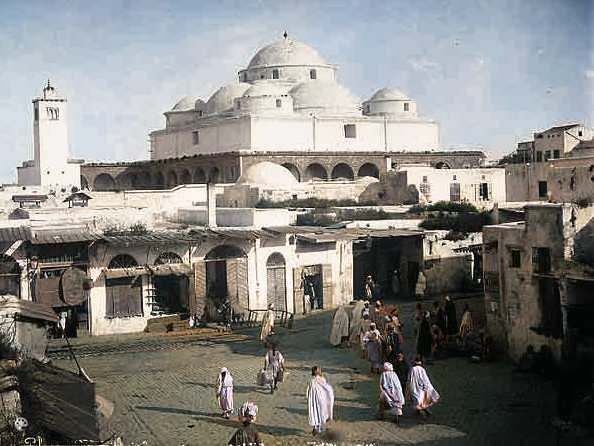

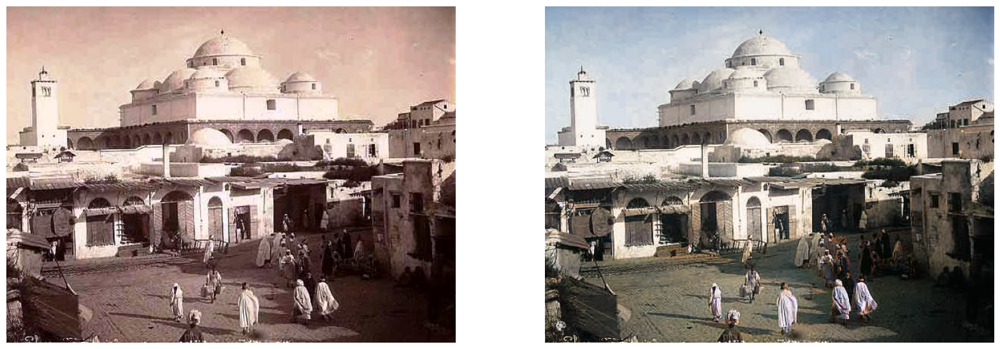

In [ ]:
source_url = 'https://www.nachoua.com/Anciennes-Photos/bab_souika.jpg' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

#### See how well render_factor values perform on the image here

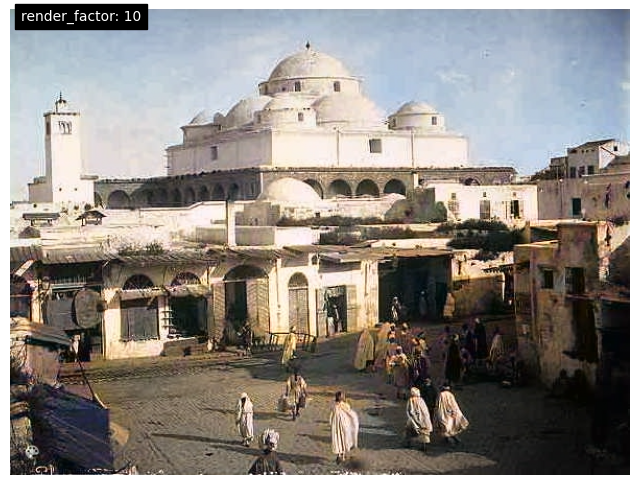

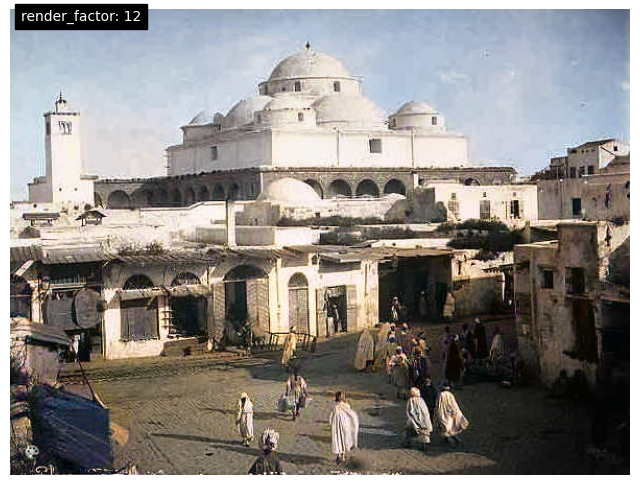

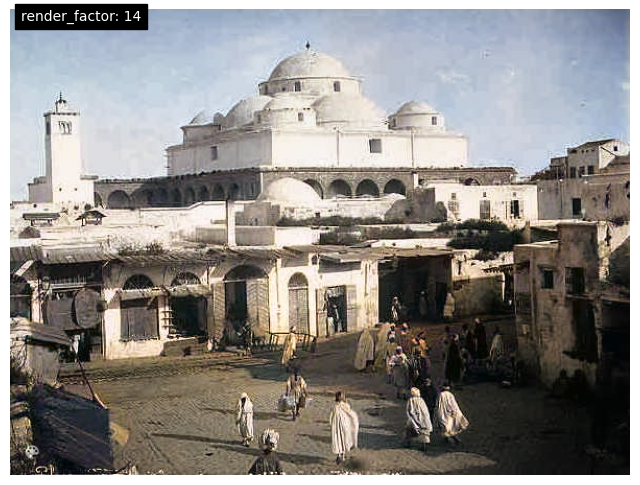

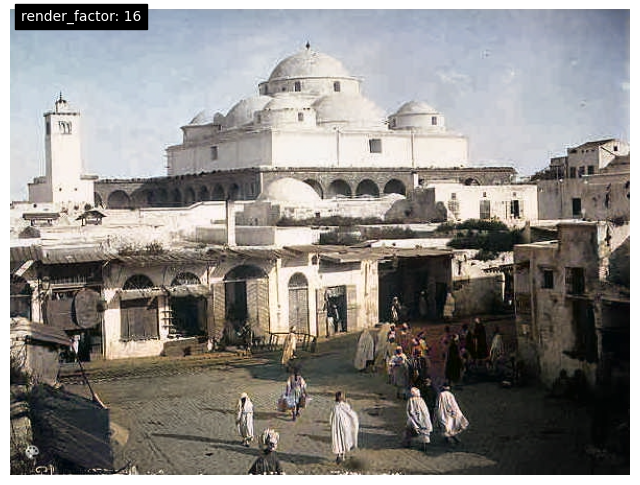

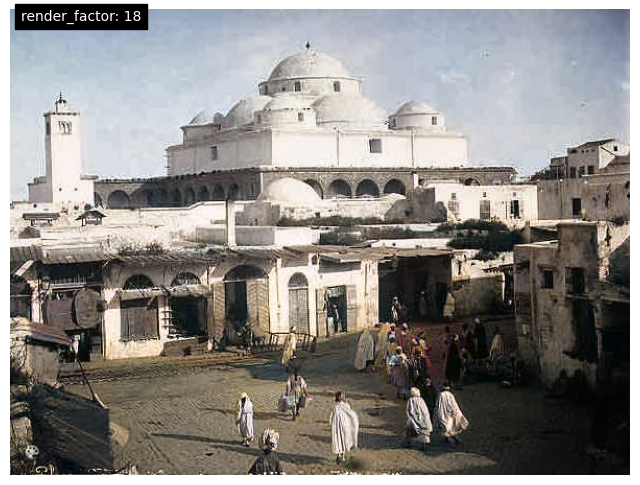

...

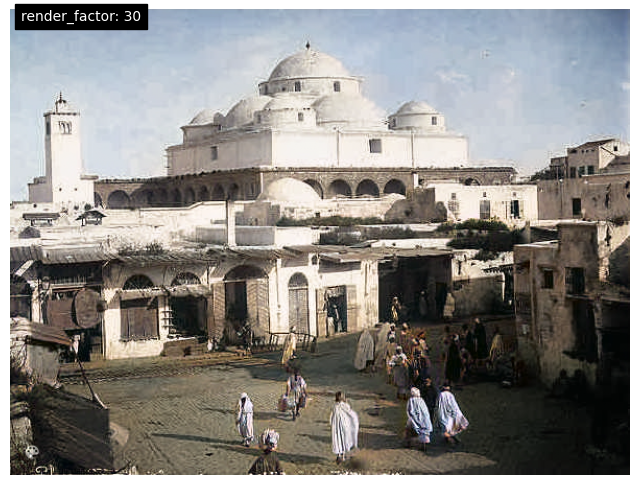

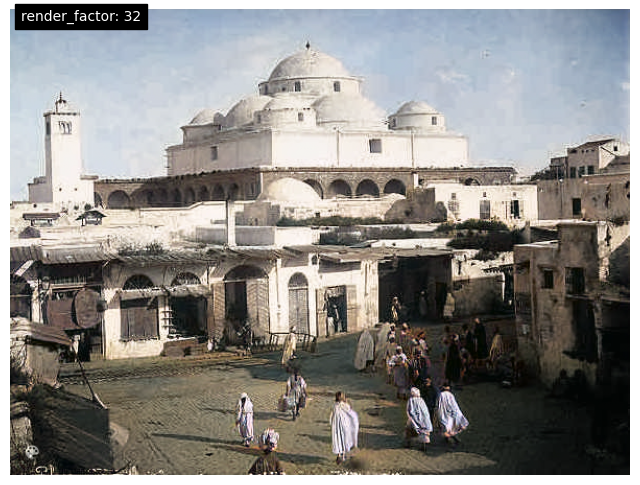

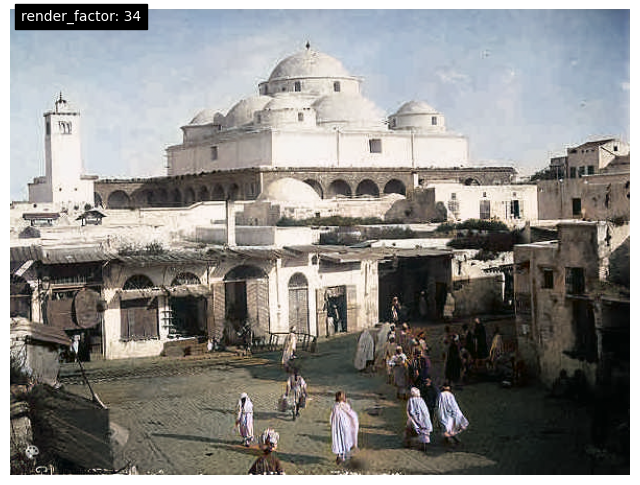

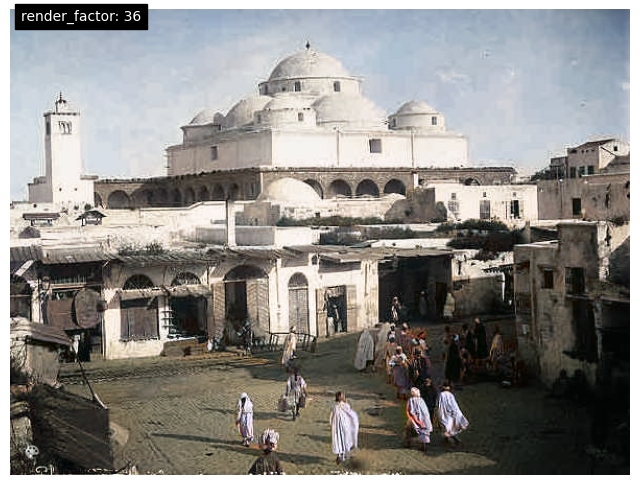

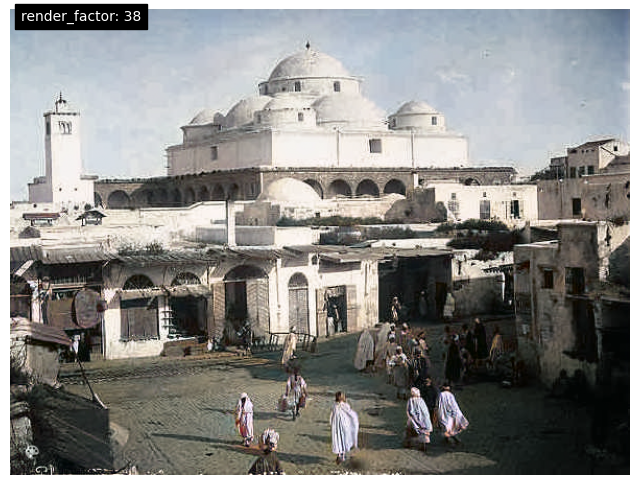

In [ ]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

---
###⚙ Recommended image sources 
* [Photos et Images Anciennes de Tunisie](https://www.nachoua.com/Anciennes-Photos/Anciennes-photos.html)